In [2]:
import numpy

In [3]:
data_245_spectrum = numpy.load("/home/ahess/Documents/245_spectrum_AJ.npz")

In [4]:
frequency = data_245_spectrum['arr_0']
amplitude = data_245_spectrum['arr_1']

Plot Logarithmisch

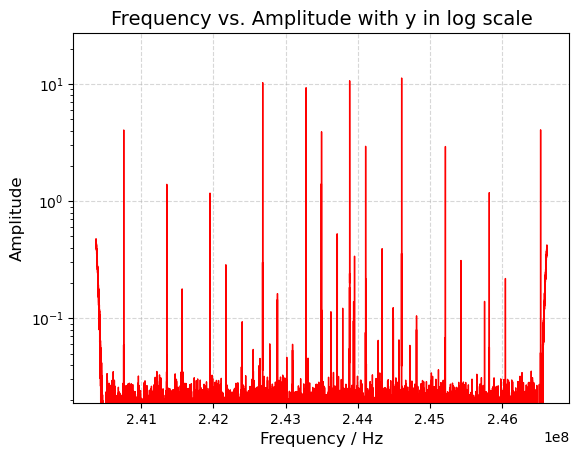

In [5]:
import matplotlib.pyplot as plt

plt.figure()
plt.plot(
    frequency,amplitude, color="red", linewidth=1)
plt.yscale("log")
plt.ylim(1.9e-2,None)
plt.title("Frequency vs. Amplitude with y in log scale", fontsize=14)
plt.xlabel("Frequency / Hz", fontsize=12)
plt.ylabel("Amplitude", fontsize=12)

plt.grid(True, linestyle="--", alpha=0.5) 

Plot Spektrum normal

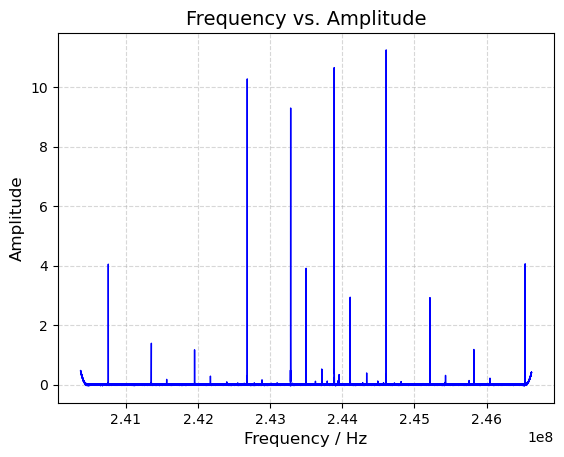

In [6]:
plt.figure()
plt.plot(
    frequency,amplitude, color="blue", linewidth=1)
#plt.ylim(0,4)
plt.title("Frequency vs. Amplitude", fontsize=14)
plt.xlabel("Frequency / Hz", fontsize=12)
plt.ylabel("Amplitude", fontsize=12)

plt.grid(True, linestyle="--", alpha=0.5) 



Interaktiver Plot

In [7]:
import plotly.graph_objects
fig = plotly.graph_objects.Figure()
fig.add_trace(plotly.graph_objects.Scatter(x=frequency,
    y=amplitude,
    mode="lines",
    name="Spektrum"
))
fig.update_layout(
    title="Interaktives Spektrum",
    xaxis_title="frequency",
    yaxis_title="amplitude"
)


fig.show()


Adaptive Peak finding

In [8]:
import numpy as np
from scipy.signal import find_peaks

def find_peaks_adaptive(
    frequency,
    amplitude,
    edge_fraction=0.2,
    prominence_mid=0.02,
    distance_mid=10,
    threshold_edge=0.01,
    merge_edge_points=7   # jetzt konsistent: Punkte statt Hz
):

    fmin, fmax = frequency.min(), frequency.max()
    span = fmax - fmin

    edge_low = fmin + edge_fraction * span
    edge_high = fmax - edge_fraction * span

    # 1. Mitte → find_peaks
    mid_mask = (frequency > edge_low) & (frequency < edge_high)

    peaks_mid, _ = find_peaks(
        amplitude[mid_mask],
        prominence=prominence_mid,
        distance=distance_mid
    )

    # Index zurück in Originalarray
    peaks_mid = np.where(mid_mask)[0][peaks_mid]

    # 2. Rand → einfache Peak-Erkennung
    edge_mask = ~mid_mask
    edge_indices = np.where(edge_mask)[0]

    peaks_edge = []

    for i in edge_indices:
        if i == 0 or i == len(amplitude) - 1:
            continue

        if amplitude[i-1] < amplitude[i] > amplitude[i+1]:
            if amplitude[i] > threshold_edge:
                peaks_edge.append(i)

    peaks_edge = np.array(peaks_edge)

    # 3. Merge im Rand (in Datenpunkten)
    def merge_peaks_fast(peaks, amplitude, merge_points=5):

        if len(peaks) == 0:
            return peaks

        peaks = np.sort(peaks)
        merged = []

        current_group = [peaks[0]]

        for p in peaks[1:]:
            if p - current_group[-1] <= merge_points:
                current_group.append(p)
            else:
                # beste Auswahl
                group = np.array(current_group)
                best = group[np.argmax(amplitude[group])]
                merged.append(best)

                current_group = [p]

        # letzte Gruppe
        group = np.array(current_group)
        best = group[np.argmax(amplitude[group])]
        merged.append(best)

        return np.array(merged)

    peaks_edge = merge_peaks_fast(
        peaks_edge,
        amplitude,
        merge_points=merge_edge_points
    )

    # 4. Kombinieren
    peaks_all = np.unique(np.concatenate([peaks_mid, peaks_edge]))

    return peaks_all

In [9]:
peaks = find_peaks_adaptive(
    frequency,
    amplitude,
    edge_fraction=0.25,
    prominence_mid=0.25,
    distance_mid=7,
    threshold_edge=0.048,
    merge_edge_points=6
)

In [10]:
import plotly.graph_objects as go

def plot_spectrum_with_peaks_plotly(
    frequency,
    amplitude,
    peaks,
    f_min=None,
    f_max=None
):

    fig = go.Figure()

    # Spektrum
    fig.add_trace(go.Scatter(
        x=frequency,
        y=amplitude,
        mode="lines",
        name="Spektrum"
    ))

    # Peaks direkt (kein Mapping nötig!)
    fig.add_trace(go.Scatter(
        x=frequency[peaks],
        y=amplitude[peaks],
        mode="markers",
        marker=dict(color="red", size=6),
        name="Peaks"
    ))

    # X-Achse begrenzen (statt schneiden!)
    if f_min is not None and f_max is not None:
        fig.update_xaxes(range=[f_min, f_max])

    fig.update_layout(
        title="Spektrum mit Peaks",
        xaxis_title="Frequency",
        yaxis_title="Amplitude"
    )

    fig.show()

In [11]:
plot_spectrum_with_peaks_plotly(
    frequency,
    amplitude,
    peaks,
    f_min=2.4053e8,
    f_max=2.4655e8
)

Cluster bilden indem man vorher die Peaks nach Widerholungsfrequenz etc. aussortiert

In [12]:
import numpy as np
import plotly.graph_objects as go
import plotly.express as px

In [13]:
def get_adaptive_peaks(frequency, amplitude):
    peaks = find_peaks_adaptive(
    frequency,
    amplitude,
    edge_fraction=0.25,
    prominence_mid=0.25,
    distance_mid=7,
    threshold_edge=0.048,
    merge_edge_points=6
    )
    return np.asarray(peaks, dtype=int)

In [14]:
def build_peak_space(frequency, amplitude, peaks):
    peak_freqs = np.asarray(frequency[peaks], dtype=float)
    peak_amps = np.asarray(amplitude[peaks], dtype=float)

    order = np.argsort(peak_freqs)
    return peaks[order], peak_freqs[order], peak_amps[order]

In [15]:
def is_left_edge_seed(seed_idx, peak_freqs, spacing_min=1.9e6, spacing_max=2.1e6):
    f0 = peak_freqs[seed_idx]
    prev_candidates = np.where(
        (peak_freqs < f0) &
        (peak_freqs >= f0 - spacing_max) &
        (peak_freqs <= f0 - spacing_min)
    )[0]
    return len(prev_candidates) == 0

In [16]:
def grow_one_chain(seed_idx, peak_freqs, peak_amps,
                   used,
                   spacing_min=1.9e6, spacing_max=2.1e6,
                   tol_hz=0.08e6, min_peaks=3):

    f0 = peak_freqs[seed_idx]

    second_candidates = np.where(
        (peak_freqs > f0 + spacing_min) &
        (peak_freqs < f0 + spacing_max) &
        (~used)
    )[0]

    best = None
    best_score = -np.inf

    for sec_idx in second_candidates:
        spacing = peak_freqs[sec_idx] - f0

        chain = [seed_idx, sec_idx]
        current = sec_idx

        while True:
            target = peak_freqs[current] + spacing

            candidates = np.where(
                np.abs(peak_freqs - target) <= tol_hz
            )[0]

            candidates = [
                c for c in candidates
                if (not used[c]) and (c not in chain) and (c > current)
            ]

            if len(candidates) == 0:
                break

            # den Kandidaten nehmen, der am nächsten am Ziel liegt
            diffs = np.abs(peak_freqs[candidates] - target)
            nxt = candidates[np.argmin(diffs)]

            chain.append(nxt)
            current = nxt

        if len(chain) < min_peaks:
            continue

        score = len(chain) * 1000 + np.sum(peak_amps[chain])

        if score > best_score:
            best_score = score
            best = {
                "indices": np.asarray(chain, dtype=int),
                "spacing_hz": float(np.median(np.diff(peak_freqs[chain]))),
            }

    return best

In [17]:
def extract_periodic_clusters(peak_freqs, peak_amps,
                              spacing_min=1.9e6, spacing_max=2.1e6,
                              tol_hz=0.08e6, min_peaks=3):

    used = np.zeros(len(peak_freqs), dtype=bool)
    groups = []

    for seed_idx in range(len(peak_freqs)):
        if used[seed_idx]:
            continue

        if not is_left_edge_seed(seed_idx, peak_freqs, spacing_min, spacing_max):
            continue

        chain = grow_one_chain(
            seed_idx=seed_idx,
            peak_freqs=peak_freqs,
            peak_amps=peak_amps,
            used=used,
            spacing_min=spacing_min,
            spacing_max=spacing_max,
            tol_hz=tol_hz,
            min_peaks=min_peaks
        )

        if chain is None:
            continue

        idx = chain["indices"]

        # global sperren
        used[idx] = True

        groups.append({
            "group_id": len(groups),
            "family_id": None,
            "indices": idx,
            "spacing_hz": chain["spacing_hz"],
            "num_peaks": len(idx),
            "start_freq_hz": float(peak_freqs[idx].min()),
            "end_freq_hz": float(peak_freqs[idx].max())
        })

    return groups, used

In [18]:
def assign_families(groups, spacing_tol_hz=25e3):
    families = []

    for g in groups:
        assigned = False

        for fam in families:
            same_spacing = abs(g["spacing_hz"] - fam["center_spacing_hz"]) <= spacing_tol_hz
            same_size = g["num_peaks"] == fam["size"]

            if same_spacing and same_size:
                g["family_id"] = fam["family_id"]
                fam["members"].append(g["group_id"])
                fam["center_spacing_hz"] = np.mean([fam["center_spacing_hz"], g["spacing_hz"]])
                assigned = True
                break

        if not assigned:
            fam_id = len(families)
            g["family_id"] = fam_id
            families.append({
                "family_id": fam_id,
                "center_spacing_hz": g["spacing_hz"],
                "size": g["num_peaks"],
                "members": [g["group_id"]]
            })

    return groups, families

In [19]:
def print_cluster_summary(groups, families, clusters):
    
    print("\nGROUPS (periodic structures)\n")
    for g in groups:
        print(f"Group {g['group_id']}")
        print(f"  family: {g.get('family_id')}")
        print(f"  repetition frequency: {g['spacing_hz']/1e6:.4f} MHz")
        print(f"  number of peaks: {g['num_peaks']}")
        print(f"  frequency span: {g['start_freq_hz']/1e6:.4f} .. {g['end_freq_hz']/1e6:.4f} MHz\n")

    print("\nFAMILIES\n")
    for fam in families:
        print(f"Family {fam['family_id']}")
        print(f"  center repetition frequency: {fam['center_spacing_hz']/1e6:.4f} MHz")
        print(f"  group members: {fam['members']}")
        print(f"  size: {len(fam['members'])}\n")

    print("\nFREQUENCY CLUSTERS\n")
    for i, c in enumerate(clusters):
        print(f"Cluster {i}: {len(c)} peaks")

In [20]:
def cluster_peaks_by_frequency(peaks, frequency, amplitude,
                               peak_to_group,
                               cluster_gap_threshold=1.0e5,
                               amp_ratio_threshold=0.6,
                               valley_threshold=0.4,
                               group_weight=0.5):

    if len(peaks) == 0:
        return []

    peaks = np.array(peaks)

    clusters = []
    current = [peaks[0]]

    for i in range(1, len(peaks)):

        p_prev = current[-1]
        p_curr = peaks[i]

        gap = frequency[p_curr] - frequency[p_prev]

        # --- GROUP INFO (jetzt sauber über Parameter) ---
        g_prev = peak_to_group.get(p_prev, None)
        g_curr = peak_to_group.get(p_curr, None)
        same_group = (g_prev == g_curr) and (g_prev is not None)

        # --- amplitude ---
        amp_ratio = amplitude[p_curr] / (amplitude[p_prev] + 1e-12)
        similar_height = (
            amp_ratio > amp_ratio_threshold and
            amp_ratio < 1 / amp_ratio_threshold
        )

        # --- valley ---
        window = amplitude[p_prev:p_curr+1]
        valley_min = np.min(window)
        peak_min = min(amplitude[p_prev], amplitude[p_curr])
        valley_ratio = valley_min / (peak_min + 1e-12)
        deep_valley = valley_ratio < valley_threshold

        score = 0

        if gap <= cluster_gap_threshold:
            score += 1

        if same_group:
            score += group_weight
        else:
            score -= group_weight

        if similar_height:
            score += 0.5

        if not deep_valley:
            score += 0.5

        if score >= 1.0:
            current.append(p_curr)
        else:
            clusters.append(current)
            current = [p_curr]

    clusters.append(current)

    print("Clusters:", len(clusters))
    print("Cluster sizes:", [len(c) for c in clusters])

    return clusters

In [ ]:
def run_pipeline(frequency, amplitude, f_min=None, f_max=None):

    peaks = get_adaptive_peaks(frequency, amplitude)
    peaks, peak_freqs, peak_amps = build_peak_space(frequency, amplitude, peaks)

    # 1. GROUPS (nur Label-System)
    groups, used_mask = extract_periodic_clusters(
        peak_freqs=peak_freqs,
        peak_amps=peak_amps,
        spacing_min=1.9e6,
        spacing_max=2.1e6,
        tol_hz=0.1e6,
        min_peaks=3
    )

    # Peak → Group mapping
    peak_to_group = {}
    for g in groups:
        for idx in g["indices"]:
            peak_to_group[idx] = g["group_id"]

    # 2. gefilterte Peaks aus Groups
    filtered_peak_indices = np.concatenate([g["indices"] for g in groups])

    # WICHTIG: SORTIERUNG NACH FREQUENZ (nicht Index!)
    filtered_peak_indices = filtered_peak_indices[
        np.argsort(peak_freqs[filtered_peak_indices])
    ]

    # optional: unique (nach Sortierung!)
    filtered_peak_indices = np.unique(filtered_peak_indices)


    # 3. CLUSTERING (komplett unabhängig von groups)
    clusters = cluster_peaks_by_frequency(
    peaks=filtered_peak_indices,
    frequency=peak_freqs,
    amplitude=peak_amps,
    peak_to_group=peak_to_group,   # NEU
    cluster_gap_threshold=1.0e5,
    amp_ratio_threshold=0.6,
    valley_threshold=0.4
)

    print("num clusters:", len(clusters))
    print("cluster sizes:", [len(c) for c in clusters])

    return peaks, peak_freqs, peak_amps, groups, clusters, peak_to_group

In [28]:
def plot_clusters_plotly(frequency, amplitude,
                          peak_freqs, peak_amps,
                          clusters,
                          peak_to_group,
                          f_min=None, f_max=None):

    fig = go.Figure()
    colors = px.colors.qualitative.Set1

    group_colors = {}

    # Spectrum
    fig.add_trace(go.Scatter(
        x=frequency,
        y=amplitude,
        mode="lines",
        name="Spectrum",
        line=dict(color="gray"),
        opacity=0.5
    ))

    # CLUSTERS ONLY
    for i, c in enumerate(clusters):
        idx = np.array(c)

        gids = [peak_to_group[p] for p in idx if p in peak_to_group]

        g_id = max(set(gids), key=gids.count) if len(gids) > 0 else None

        if g_id is not None and g_id not in group_colors:
            group_colors[g_id] = colors[len(group_colors) % len(colors)]

        color = group_colors.get(g_id, "gray")

        fig.add_trace(go.Scatter(
            x=peak_freqs[idx],
            y=peak_amps[idx],
            mode="markers",
            marker=dict(size=8, color=color),
            name=f"Cluster {i} | G{g_id}"
        ))

    fig.update_layout(
        title="Clusters colored by Group (independent clustering)",
        xaxis_title="Frequency",
        yaxis_title="Amplitude",
        hovermode="closest"
    )

    #fig.show()
    return fig

In [29]:
peaks, peak_freqs, peak_amps, groups, clusters, peak_to_group = run_pipeline(
    frequency,
    amplitude,
    f_min=2.4053e8,
    f_max=2.4655e8
)

plot_clusters_plotly(
    frequency,
    amplitude,
    peak_freqs,
    peak_amps,
    clusters,
    peak_to_group,
    f_min=2.4053e8,
    f_max=2.4655e8
)

Clusters: 16
Cluster sizes: [3, 3, 1, 1, 1, 3, 3, 1, 1, 1, 3, 3, 1, 1, 1, 3]
num clusters: 16
cluster sizes: [3, 3, 1, 1, 1, 3, 3, 1, 1, 1, 3, 3, 1, 1, 1, 3]


Polynomial Fit der Peaks die zu einem cluster gehören

In [30]:
# Peak-space -> Original spectrum mapping

clusters_original = []

for c in clusters:
    clusters_original.append(
        peaks[np.array(c)]
    )

In [31]:
def extract_cluster_windows(frequency, clusters, flank_factor=0.2):

    windows = []
    n = len(frequency)

    for cluster in clusters:

        if len(cluster) == 0:
            continue

        # auch Einzelpeaks erlauben!
        left_idx = cluster[0]
        right_idx = cluster[-1]

        f_left = frequency[left_idx]
        f_right = frequency[right_idx]

        width = f_right - f_left

        # FALL: Einzelpeak → künstliches Fenster erzeugen
        if width == 0:
            width = (frequency[1] - frequency[0]) * 10  # kleines Standardfenster

        f_start = f_left - flank_factor * width
        f_end   = f_right + flank_factor * width

        start_idx = np.searchsorted(frequency, f_start)
        end_idx   = np.searchsorted(frequency, f_end)

        # Clipping
        start_idx = max(0, start_idx)
        end_idx = min(n - 1, end_idx)

        # FALL: Fenster kollabiert → erzwinge Minimalfenster
        if end_idx <= start_idx:
            center = left_idx
            start_idx = max(0, center - 5)
            end_idx = min(n - 1, center + 5)

        windows.append((start_idx, end_idx))

    return windows


In [32]:
def refine_window_with_derivative(
    amplitude,
    peak_idx,
    gradient,
    max_width=80,
    rel_slope=0.3,
    patience=3
):

    grad = gradient
    peak_grad = grad[peak_idx]

    threshold = rel_slope * peak_grad

    left = peak_idx
    right = peak_idx

    # links
    below_count = 0
    while left > 1:
        if grad[left] < threshold:
            below_count += 1
            if below_count >= patience:
                break
        else:
            below_count = 0

        if peak_idx - left > max_width:
            break

        left -= 1

    # rechts
    below_count = 0
    while right < len(amplitude) - 2:
        if grad[right] < threshold:
            below_count += 1
            if below_count >= patience:
                break
        else:
            below_count = 0

        if right - peak_idx > max_width:
            break

        right += 1

    return left, right

In [33]:
def fit_peak_polynomial(x, y, max_degree=20, min_degree=3):

    # Normalisierung
    x_mean = np.mean(x)
    x_std = np.std(x)

    if x_std == 0:
        return None

    x_norm = (x - x_mean) / x_std

    # Gewichtung (einmal berechnet)
    grad = np.abs(np.gradient(y))
    weights = grad / (np.max(grad) + 1e-12)
    weights = 0.7 * weights + 0.3

    best_score = np.inf
    best_fit = None

    prev_mse = np.inf

    for degree in range(min_degree, max_degree + 1):

        coeffs = np.polyfit(x_norm, y, degree, w=weights)
        y_pred = np.polyval(coeffs, x_norm)

        mse = np.mean((y - y_pred)**2)

        # Early stopping
        if abs(prev_mse - mse) < 1e-6:
            break

        prev_mse = mse

        if mse < best_score:
            best_score = mse
            best_fit = {
                "coeffs": coeffs,
                "degree": degree,
                "x_mean": x_mean,
                "x_std": x_std
            }

    return best_fit

In [34]:
def evaluate_fit(fit, x):

    x_norm = (x - fit["x_mean"]) / fit["x_std"]
    return np.polyval(fit["coeffs"], x_norm)

In [35]:
def fit_quality_check(x, y, fit, max_relative_error=0.009):

    y_pred = evaluate_fit(fit, x)

    mse = np.mean((y - y_pred)**2)

    peak_height = np.max(y)

    relative_error = mse / (np.max(y) - np.min(y))**2
    
    return relative_error < max_relative_error, relative_error


In [36]:
def get_peak_position_from_fit(fit, x):

    x = np.asarray(x)

    x_mean = fit["x_mean"]
    x_std = fit["x_std"]

    # normierte x-Achse
    x_norm = (x - x_mean) / x_std

    # Fit auswerten
    y_fit = np.polyval(fit["coeffs"], x_norm)

    # grobes Maximum
    idx = np.argmax(y_fit)

    # ----------------------------
    # Parabolische Verfeinerung (bessere Position!)
    # ----------------------------
    if 0 < idx < len(x) - 1:
        y0, y1, y2 = y_fit[idx - 1], y_fit[idx], y_fit[idx + 1]
        x0, x1, x2 = x[idx - 1], x[idx], x[idx + 1]

        # Parabel-Shift im Indexraum
        denom = (y0 - 2*y1 + y2)
        if denom != 0:
            delta = 0.5 * (y0 - y2) / denom
            x_peak = x1 + delta * (x2 - x0) / 2
        else:
            x_peak = x[idx]
    else:
        x_peak = x[idx]

    return x_peak, y_fit[idx]

In [37]:
def compute_peak_area(fit, x):

    x_mean = fit["x_mean"]
    x_std = fit["x_std"]

    x_norm = (x - x_mean) / x_std
    y_fit = np.polyval(fit["coeffs"], x_norm)

    y_fit = np.maximum(y_fit, 0)
    area = np.trapezoid(y_fit, x)

    return area

In [38]:
def compute_fwhm(x, y):
    x = np.asarray(x)
    y = np.asarray(y)

    half_max = np.max(y) / 2

    # finde Indizes oberhalb Halbmaximum
    above = np.where(y >= half_max)[0]

    if len(above) < 2:
        return 0.0

    i_left = above[0]
    i_right = above[-1]

    # lineare Interpolation links
    if i_left == 0:
        x_left = x[0]
    else:
        x1, x2 = x[i_left - 1], x[i_left]
        y1, y2 = y[i_left - 1], y[i_left]
        x_left = x1 + (half_max - y1) * (x2 - x1) / (y2 - y1)

    # lineare Interpolation rechts
    if i_right == len(y) - 1:
        x_right = x[-1]
    else:
        x1, x2 = x[i_right], x[i_right + 1]
        y1, y2 = y[i_right], y[i_right + 1]
        x_right = x1 + (half_max - y1) * (x2 - x1) / (y2 - y1)

    return x_right - x_left

In [39]:
def estimate_position_error(fwhm):

    # Standard-Näherung für Gauß-ähnliche Peaks:
    return fwhm / (2 * np.sqrt(2 * np.log(2)))

In [40]:
def analyze_peak_shape(x, fit):

    # Fit auswerten
    x_mean = fit["x_mean"]
    x_std = fit["x_std"]
    coeffs = fit["coeffs"]

    x_norm = (x - x_mean) / x_std
    y_fit = np.polyval(coeffs, x_norm)

    # Maxima finden
    peaks, _ = find_peaks(y_fit, prominence=np.max(y_fit)*0.1)

    # =========================
    # SINGLE PEAK
    # =========================
    if len(peaks) == 1:

        idx = peaks[0]

        peak_pos = x[idx] if idx < len(x) else np.nan
        peak_amp = y_fit[idx]

        fwhm = compute_fwhm(x, y_fit)
        pos_err = estimate_position_error(fwhm)

        return {
            "type": "single",
            "peak_position": peak_pos,
            "amplitude": peak_amp,
            "fwhm": fwhm,
            "position_error": pos_err
        }

    # =========================
    # DOUBLE PEAK
    # =========================
    elif len(peaks) >= 2:

        # zwei höchste Peaks nehmen
        peak_heights = y_fit[peaks]
        top2_idx = np.argsort(peak_heights)[-2:]

        p1, p2 = peaks[top2_idx]

        x1, x2 = x[p1], x[p2]
        y1, y2 = y_fit[p1], y_fit[p2]

        # gewichtete Position
        pos = (x1*y1 + x2*y2) / (y1 + y2)

        # gemeinsames FWHM
        fwhm = compute_fwhm(x, y_fit)

        # Fehler
        pos_err = estimate_position_error(fwhm)

        return {
            "type": "double",
            "peak_position": pos,
            "peaks_positions": (x1, x2),
            "amplitudes": (y1, y2),
            "fwhm": fwhm,
            "position_error": pos_err
        }

    else:
        return None

In [41]:
def fit_peaks_polynomial(
    frequency,
    amplitude,
    clusters,
    peak_to_group
):

    # Gradient EINMAL berechnen
    gradient = np.abs(np.gradient(amplitude))

    # Fenster DIREKT aus deinen echten Clustern
    coarse_windows = extract_cluster_windows(frequency, clusters)

    results = []

    stats = {
        "too_small": 0,
        "fit_failed": 0,
        "quality_failed": 0,
        "accepted": 0,
        "total_clusters": len(clusters),
        "used_clusters": 0,
        "skipped_no_window": 0
    }

    print("==== DEBUG INFO ====")
    print("Total clusters:", len(clusters))
    print("Total windows:", len(coarse_windows))
    print("====================")

    for i, cluster in enumerate(clusters):

        if i >= len(coarse_windows):
            stats["skipped_no_window"] += 1
            continue

        left_c, right_c = coarse_windows[i]

        # Cluster split (Tal-basiert)
        if len(cluster) == 1:
            peak_groups = [cluster]
        else:
            peak_groups = []
            current_group = [cluster[0]]

            for j in range(1, len(cluster)):

                p_prev = current_group[-1]
                p_curr = cluster[j]

                valley = amplitude[p_prev:p_curr+1]
                valley_min = np.min(valley)

                peak_min = min(amplitude[p_prev], amplitude[p_curr])
                valley_ratio = valley_min / (peak_min + 1e-12)

                if valley_ratio > 0.7:
                    current_group.append(p_curr)
                else:
                    peak_groups.append(current_group)
                    current_group = [p_curr]

            peak_groups.append(current_group)

        # Fit pro Gruppe
        for group in peak_groups:

            stats["used_clusters"] += 1

            peak_center = group[np.argmax(amplitude[group])]

            # Fenster
            left, right = refine_window_with_derivative(
                amplitude,
                peak_center,
                gradient
            )

            if right <= left:
                left, right = left_c, right_c

            # harte Begrenzung
            peak_idx = peak_center

            left = max(left, peak_idx - 30)
            right = min(right, peak_idx + 30)

            # Tal-Begrenzung
            if left < peak_idx:
                l = max(left, peak_idx - 30)
                local_min_left = np.argmin(amplitude[l:peak_idx+1]) + l
                left = max(left, local_min_left)

            if right > peak_idx:
                r = min(right, peak_idx + 30)
                local_min_right = np.argmin(amplitude[peak_idx:r+1]) + peak_idx
                right = min(right, local_min_right)

            # Safety
            if peak_center < left or peak_center >= right:
                left = max(left_c, peak_center - 5)
                right = min(right_c, peak_center + 5)

            x_win = frequency[left:right]
            y_win = amplitude[left:right]

            if len(x_win) < 5:
                stats["too_small"] += 1
                continue

            fit = fit_peak_polynomial(x_win, y_win)

            if fit is None:
                stats["fit_failed"] += 1
                continue

            analysis = analyze_peak_shape(x_win, fit)

            ok, err = fit_quality_check(
                x_win,
                y_win,
                fit,
                max_relative_error=0.15
            )

            if not ok:
                stats["quality_failed"] += 1
            else:
                stats["accepted"] += 1

            peak_pos, peak_height = get_peak_position_from_fit(fit, x_win)
            area = compute_peak_area(fit, x_win)

            results.append({
                "peak_index": peak_center,

                # WICHTIG
                "cluster_id": i,
                "group_id": peak_to_group.get(peak_center, None),

                "cluster_peaks": cluster,

                "window": (left, right),
                "fit": fit,
                "valid": ok,
                "error": err,

                "peak_position_fit": peak_pos,
                "peak_height_fit": peak_height,
                "area": area,
                "analysis": analysis
            })

    print("\n===== FIT STATISTICS =====")
    print(stats)
    print("==========================\n")

    return results

In [42]:
import plotly.graph_objects as go

def plot_spectrum_with_polynomial_fits(
    frequency,
    amplitude,
    peaks,
    fit_results=None,
    f_min=None,
    f_max=None
):

    fig = go.Figure()

    # Spektrum
    fig.add_trace(go.Scatter(
        x=frequency,
        y=amplitude,
        mode="lines",
        name="Spektrum"
    ))

    # Peaks
    fig.add_trace(go.Scatter(
        x=frequency[peaks],
        y=amplitude[peaks],
        mode="markers",
        marker=dict(color="red", size=6),
        name="Peaks"
    ))

    # Fits
    if fit_results is not None:
        for res in fit_results:

            left, right = res["window"]
            fit = res["fit"]

            if fit is None:
                continue

            x_win = frequency[left:right]
            y_fit = evaluate_fit(fit, x_win)

            fig.add_trace(go.Scatter(
                x=x_win,
                y=y_fit,
                mode="lines",
                line=dict(dash="dot", width=3 if res["valid"] else 1),
                name=f"Fit deg {fit['degree']}"
            ))

    if f_min is not None and f_max is not None:
        fig.update_xaxes(range=[f_min, f_max])

    fig.update_layout(
        title="Spektrum mit Polynomial Fits",
        xaxis_title="Frequency",
        yaxis_title="Amplitude"
    )

    fig.show()


In [43]:
peaks = find_peaks_adaptive(
    frequency,
    amplitude,
    edge_fraction=0.25,
    prominence_mid=0.25,
    distance_mid=7,
    threshold_edge=0.048,
    merge_edge_points=6
)

fit_results = fit_peaks_polynomial(
    frequency,
    amplitude,
    clusters_original,
    peak_to_group
)

plot_spectrum_with_polynomial_fits(
    frequency,
    amplitude,
    peaks,
    fit_results=fit_results,
    f_min=2.4053e8,
    f_max=2.4655e8
)

==== DEBUG INFO ====
Total clusters: 16
Total windows: 16

===== FIT STATISTICS =====
{'too_small': 0, 'fit_failed': 0, 'quality_failed': 0, 'accepted': 26, 'total_clusters': 16, 'used_clusters': 26, 'skipped_no_window': 0}



Normalisierung der Cluster über Fläche und L2-Normalisierung

In [44]:
def normalize_peak_shape(x, y):

    # Fläche entfernen
    area = np.trapezoid(y, x)
    if area > 0:
        y = y / area

    # Energie normieren (L2)
    norm = np.sqrt(np.sum(y**2))
    if norm > 0:
        y = y / norm

    return y

In [45]:
def build_shape_spectrum_filtered(results, frequency, f_min=None, f_max=None):

    spectrum = np.zeros_like(frequency)

    for r in results:

        if not r["valid"]:
            continue

        left, right = r["window"]
        x = frequency[left:right]

        # NEU: Bereichsfilter pro Peak
        mask = np.ones_like(x, dtype=bool)

        if f_min is not None:
            mask &= x >= f_min

        if f_max is not None:
            mask &= x <= f_max

        if np.sum(mask) < 3:
            continue

        x = x[mask]

        fit = r["fit"]
        y = evaluate_fit(fit, x)
        y = np.maximum(y, 0)

        # Shape-Normierung
        y = normalize_peak_shape(x, y)

        # Index im globalen Array
        idx = np.searchsorted(frequency, x[0])

        if idx + len(y) < len(spectrum):
            spectrum[idx:idx+len(y)] += y

    return spectrum

In [46]:
fitted_peaks = np.array([
    r["peak_index"]
    for r in fit_results
    if r["valid"]
])

In [47]:
def plot_spectrum_filtered(frequency, spectrum, fitted_peaks,
                           f_min=None, f_max=None):

    import plotly.graph_objects as go

    mask = np.ones_like(frequency, dtype=bool)

    if f_min is not None:
        mask &= frequency >= f_min

    if f_max is not None:
        mask &= frequency <= f_max

    fig = go.Figure()

    # Spektrum
    fig.add_trace(go.Scatter(
        x=frequency[mask],
        y=spectrum[mask],
        mode="lines",
        name="Shape-normalized Spectrum"
    ))

    # NUR gefittete Peaks
    if fitted_peaks is not None:

        fitted_peaks = np.asarray(fitted_peaks)

        # nur Peaks im sichtbaren Bereich
        peak_mask = mask[fitted_peaks]

        fig.add_trace(go.Scatter(
            x=frequency[fitted_peaks][peak_mask],
            y=spectrum[fitted_peaks][peak_mask],
            mode="markers",
            marker=dict(color="red", size=6),
            name="Fitted Peaks"
        ))

    fig.update_layout(
        title="Shape-normalized + gefiltertes Spektrum",
        xaxis_title="Frequency",
        yaxis_title="Intensity"
    )

    fig.show()

In [48]:
spectrum = build_shape_spectrum_filtered(
    fit_results,
    frequency,
    f_min=2.4053e8,
    f_max=2.4655e8
)

plot_spectrum_filtered(
    frequency,
    spectrum,
    fitted_peaks,
    f_min=2.4053e8,
    f_max=2.4655e8
)

Vorbereitung für Crosscorrelation

In [49]:
def build_cluster_template_shape(cluster_id, fit_results, frequency, target_len=200):

    parts = []

    for r in fit_results:

        if not r["valid"]:
            continue
        if r["cluster_id"] != cluster_id:
            continue

        x = frequency[r["window"][0]:r["window"][1]]
        y = evaluate_fit(r["fit"], x)

        y = np.maximum(y, 0)

        # L2 Norm (Shape-Invarianz)
        y = y / (np.linalg.norm(y) + 1e-12)

        if len(y) < 5:
            continue

        # RESAMPLING → gleiche Länge
        y = np.interp(
            np.linspace(0, 1, target_len),
            np.linspace(0, 1, len(y)),
            y
        )

        parts.append(y)

    if len(parts) == 0:
        return None

    parts = np.array(parts)

    template = np.mean(parts, axis=0)
    template = template / (np.linalg.norm(template) + 1e-12)

    return template

In [50]:
from scipy.ndimage import gaussian_filter1d

def cross_correlation_l2(signal, template):

    signal = signal - np.mean(signal)
    template = template - np.mean(template)

    signal = signal / (np.linalg.norm(signal) + 1e-12)
    template = template / (np.linalg.norm(template) + 1e-12)

    return np.correlate(signal, template, mode="full")

In [51]:
def lag_axis(n, df):
    return np.arange(-n + 1, n) * df

In [52]:
def extract_repetitions_robust(corr, freq_axis,
                               f_min=1.9e6,
                               f_max=2.1e6,
                               top_k=5,
                               smooth_sigma=2):

    corr_smooth = gaussian_filter1d(corr, sigma=smooth_sigma)
    corr_smooth = corr_smooth / (np.max(np.abs(corr_smooth)) + 1e-12)

    idx = np.argsort(corr_smooth)[-top_k:]
    positions = np.sort(freq_axis[idx])

    positions = positions[
        (positions >= f_min) &
        (positions <= f_max)
    ]

    diffs = np.diff(positions) if len(positions) > 1 else []

    return positions, diffs, corr_smooth

In [53]:
def analyze_cluster_crosscorr(cluster_id,
                               fit_results,
                               shape_spectrum,
                               frequency,
                               f_min=1.9e6,
                               f_max=2.1e6):

    template = build_cluster_template_shape(
        cluster_id,
        fit_results,
        frequency
    )

    if template is None:
        return None

    corr = cross_correlation_l2(shape_spectrum, template)

    print("\n--- DEBUG ---")
    print("template norm:", np.linalg.norm(template))
    print("shape spectrum norm:", np.linalg.norm(shape_spectrum))
    print("corr max:", np.max(corr))
    print("corr min:", np.min(corr))
    print("corr std:", np.std(corr))

    df = np.mean(np.diff(frequency))
    freq_axis = lag_axis(len(shape_spectrum), df)

    positions, diffs, corr_smooth = extract_repetitions_robust(
        corr,
        freq_axis,
        f_min=f_min,
        f_max=f_max,
        top_k=5,
        smooth_sigma=2
    )

    print(f"\nCluster {cluster_id}")

    if len(positions) > 0:
        print("Wiederholungen (MHz):")
        for p in positions:
            print(f"  {p/1e6:.3f}")

    return positions, diffs, corr_smooth

In [54]:
results_cc = {}

for cid in sorted(set(r["cluster_id"] for r in fit_results)):

    results_cc[cid] = analyze_cluster_crosscorr(
        cid,
        fit_results,
        spectrum,
        frequency,
        f_min=1.9e6,
        f_max=2.1e6
    )


--- DEBUG ---
template norm: 0.9999999999995148
shape spectrum norm: 5.106325919547616
corr max: 0.19106344905863257
corr min: -0.13690138813081468
corr std: 0.01088151002848231

Cluster 0

--- DEBUG ---
template norm: 0.9999999999995447
shape spectrum norm: 5.106325919547616
corr max: 0.15136020633471306
corr min: -0.1444973160475952
corr std: 0.010347300258442375

Cluster 1

--- DEBUG ---
template norm: 0.9999999999995729
shape spectrum norm: 5.106325919547616
corr max: 0.2049487253737023
corr min: -0.10414683228370497
corr std: 0.01026819270439713

Cluster 2

--- DEBUG ---
template norm: 0.9999999999996229
shape spectrum norm: 5.106325919547616
corr max: 0.1978254973370336
corr min: -0.12901582086203595
corr std: 0.01027748724773668

Cluster 3

--- DEBUG ---
template norm: 0.9999999999997226
shape spectrum norm: 5.106325919547616
corr max: 0.20990055109100328
corr min: -0.16068615078946386
corr std: 0.011249229912379014

Cluster 4

--- DEBUG ---
template norm: 0.9999999999995
shape

Cross Correlation und Zuordnung / Gruppierung nach Shape

In [55]:
def get_cluster_positions(fit_results):

    positions = {}

    for r in fit_results:

        if not r["valid"]:
            continue

        cid = r["cluster_id"]
        pos = r["peak_position_fit"]

        positions.setdefault(cid, []).append(pos)

    # Mittelwert pro Cluster
    for cid in positions:
        positions[cid] = np.mean(positions[cid])

    return positions

In [56]:
import numpy as np

def compute_cluster_templates(fit_results, frequency):

    cluster_ids = sorted(set(r["cluster_id"] for r in fit_results))
    templates = {}

    for cid in cluster_ids:

        template = build_cluster_template_shape(
            cid,
            fit_results,
            frequency
        )

        if template is not None:
            template = template / (np.linalg.norm(template) + 1e-12)
            templates[cid] = template

    return templates

In [57]:
def compute_similarity_matrix(templates):

    cluster_ids = list(templates.keys())
    n = len(cluster_ids)

    sim = np.zeros((n, n))

    for i in range(n):
        for j in range(n):

            t1 = templates[cluster_ids[i]]
            t2 = templates[cluster_ids[j]]

            # Cosine similarity (identisch zu L2-normalisierter Cross-Corr-Logik)
            sim[i, j] = np.dot(t1, t2)

    return cluster_ids, sim

In [58]:
templates = compute_cluster_templates(fit_results, frequency)
cluster_ids, sim_matrix = compute_similarity_matrix(templates)

In [59]:
def group_clusters_strict_periodic(sim_matrix,
                                   cluster_ids,
                                   cluster_positions,
                                   freq_min=1.9e6,
                                   freq_max=2.1e6,
                                   sim_threshold=0.7,
                                   min_repeats=3,
                                   max_repeats=4):

    groups = []
    used = set()

    for i, cid in enumerate(cluster_ids):

        if cid in used:
            continue

        base_pos = cluster_positions[cid]

        candidates = []

        for j, cid2 in enumerate(cluster_ids):

            if cid2 == cid:
                continue

            # Similarity check
            if sim_matrix[i, j] < sim_threshold:
                continue

            dist = abs(cluster_positions[cid2] - base_pos)

            # prüfen ob Abstand ~ k * 2 MHz
            for k in range(1, max_repeats + 1):

                if freq_min * k <= dist <= freq_max * k:
                    candidates.append((cid2, dist, k))
                    break

        # BASE + passende Kandidaten
        group = [cid] + [c[0] for c in candidates]

        # NUR akzeptieren wenn genug Wiederholungen
        if len(group) >= min_repeats:

            # sortieren nach Position (wichtig für Periodizität)
            group = sorted(group, key=lambda x: cluster_positions[x])

            # Konsistenzcheck (Periodizität)
            diffs = np.diff([cluster_positions[g] for g in group])

            # Prüfe ob alle Abstände ungefähr gleich sind
            if len(diffs) > 1:
                mean_diff = np.mean(diffs)

                if not all(freq_min <= d <= freq_max for d in diffs):
                    continue

            # max repeats begrenzen
            group = group[:max_repeats]

            groups.append(group)
            used.update(group)

    return groups

In [60]:
cluster_positions = get_cluster_positions(fit_results)

groups = group_clusters_strict_periodic(
    sim_matrix,
    cluster_ids,
    cluster_positions,
    freq_min=1.9e6,
    freq_max=2.1e6,
    sim_threshold=0.7,
    min_repeats=3,   # HIER wichtig
    max_repeats=4
)

for i, g in enumerate(groups):
    print(f"Group {i}: {g}")

Group 0: [0, 5, 10, 15]
Group 1: [1, 6, 11]
Group 2: [2, 7, 12]
Group 3: [4, 9, 14]
Group 4: [3, 8, 13]


In [61]:
#for i, cid1 in enumerate(cluster_ids):
    #for j, cid2 in enumerate(cluster_ids):
        #if i < j:
           # print(cid1, cid2, sim_matrix[i, j])

In [62]:
import plotly.graph_objects as go
import numpy as np

def plot_grouped_clusters_clean(
    frequency,
    spectrum,
    fit_results,
    groups
):

    fig = go.Figure()

    colors = [
        "red", "blue", "green", "orange",
        "purple", "cyan", "magenta", "gold"
    ]

    # =========================
    # 1. SPEKTRUM PRO CLUSTER (mit Baseline-Projektion)
    # =========================
    for gid, g in enumerate(groups):

        color = colors[gid % len(colors)]
        legend_added = False

        for cid in g:

            for r in fit_results:

                if not r["valid"] or r["cluster_id"] != cid:
                    continue

                left, right = r["window"]

                x = frequency[left:right]
                y = spectrum[left:right]

                # ---- Baseline-Projektion ----
                x_full = np.concatenate([x, x[::-1]])
                y_full = np.concatenate([y, np.zeros_like(y)])

                fig.add_trace(go.Scatter(
                    x=x_full,
                    y=y_full,
                    fill="none",
                    mode="lines",
                    line=dict(color=color, width=2),
                    fillcolor=None,
                    opacity=1.0,
                    name=f"Group {gid}" if not legend_added else None,
                    showlegend=not legend_added
                ))

                legend_added = True

    # =========================
    # 2. PEAKS (einmal pro Gruppe)
    # =========================
    for gid, g in enumerate(groups):

        color = colors[gid % len(colors)]

        px, py = [], []
        added = False

        for cid in g:

            for r in fit_results:

                if not r["valid"] or r["cluster_id"] != cid:
                    continue

                peak_x = r["peak_position_fit"]
                peak_y = np.interp(peak_x, frequency, spectrum)

                px.append(peak_x)
                py.append(peak_y)

        fig.add_trace(go.Scatter(
            x=px,
            y=py,
            mode="markers",
            marker=dict(size=8, color=color),
            name=f"Peaks Group {gid}",
            showlegend=False
        ))

    # =========================
    # 3. ORIGINAL SPEKTRUM (dezent im Hintergrund)
    # =========================
    fig.add_trace(go.Scatter(
        x=frequency,
        y=spectrum,
        mode="lines",
        line=dict(color="lightgray", width=2),
        name="Spectrum",
        opacity=0.5,
        showlegend=True
    ))

    # =========================
    # LAYOUT
    # =========================
    fig.update_layout(
        title="Cluster mit Baseline-Projektion",
        xaxis_title="Frequency",
        yaxis_title="Amplitude",
        template="plotly_white"
    )

    fig.show()

In [63]:
plot_grouped_clusters_clean(
    frequency,
    spectrum,
    fit_results,
    groups
)

Analyse der Gruppen (Positionen und so)

In [64]:
import numpy as np

def analyze_group_periodicity(groups, cluster_positions):

    results = {}

    for gid, group in enumerate(groups):

        # Positionen holen und sortieren
        positions = np.array([cluster_positions[cid] for cid in group])
        positions = np.sort(positions)

        # -----------------------------
        # Abstände
        # -----------------------------
        diffs = np.diff(positions)
        diffs_mhz = diffs / 1e6

        # -----------------------------
        # klassische Statistik (BEHALTEN)
        # -----------------------------
        if len(diffs_mhz) > 0:
            mean_dist = np.mean(diffs_mhz)
            std_dist = np.std(diffs_mhz)

            # -----------------------------
            # robuste Fehlermaße
            # -----------------------------
            abs_dev = np.abs(diffs_mhz - mean_dist)
            grid_error = np.mean(abs_dev)
            max_error = np.max(abs_dev)
            rel_error = grid_error / mean_dist

        else:
            mean_dist = None
            std_dist = None
            grid_error = None
            max_error = None
            rel_error = None

        # -----------------------------
        # Linearitätsmodell (wichtig!)
        # -----------------------------
        if len(positions) > 1:
            x = np.arange(len(positions))

            p = np.polyfit(x, positions, 1)
            fit_line = np.polyval(p, x)

            linearity_error = np.mean(np.abs(positions - fit_line)) / 1e6

            ss_res = np.sum((positions - fit_line) ** 2)
            ss_tot = np.sum((positions - np.mean(positions)) ** 2)
            r2 = 1 - ss_res / (ss_tot + 1e-12)

        else:
            linearity_error = None
            r2 = None

        # -----------------------------
        # Ausgabe
        # -----------------------------
        print(f"\nGroup {gid}: {group}")

        print("Positionen (MHz):")
        for p in positions:
            print(f"  {p/1e6:.3f}")

        if len(diffs_mhz) > 0:
            print("\nAbstände (MHz):")
            for d in diffs_mhz:
                print(f"  {d:.3f}")

            print(f"\n→ Mittelwert: {mean_dist:.3f} MHz")
            print(f"→ Std-Abweichung: {std_dist:.6f} MHz")

            print(f"→ Grid-Fehler: {grid_error:.6f} MHz")
            print(f"→ Max-Abweichung: {max_error:.6f} MHz")
            print(f"→ Relativer Fehler: {rel_error:.6f}")

        if r2 is not None:
            print(f"→ Linearitätsfehler: {linearity_error:.6f} MHz")
            print(f"→ R²: {r2:.6f}")

        # -----------------------------
        # speichern
        # -----------------------------
        results[gid] = {
            "positions": positions,
            "diffs_mhz": diffs_mhz,

            # klassische Metriken
            "mean_mhz": mean_dist,
            "std_mhz": std_dist,

            # robuste Fehler
            "grid_error": grid_error,
            "max_error": max_error,
            "rel_error": rel_error,

            # strukturelle Qualität
            "linearity_error": linearity_error,
            "r2": r2
        }

    return results

In [65]:
periodicity_results = analyze_group_periodicity(
    groups,
    cluster_positions
)


Group 0: [0, 5, 10, 15]
Positionen (MHz):
  240.755
  242.681
  244.607
  246.533

Abstände (MHz):
  1.926
  1.926
  1.926

→ Mittelwert: 1.926 MHz
→ Std-Abweichung: 0.000027 MHz
→ Grid-Fehler: 0.000023 MHz
→ Max-Abweichung: 0.000035 MHz
→ Relativer Fehler: 0.000012
→ Linearitätsfehler: 0.000012 MHz
→ R²: 1.000000

Group 1: [1, 6, 11]
Positionen (MHz):
  241.353
  243.284
  245.215

Abstände (MHz):
  1.931
  1.931

→ Mittelwert: 1.931 MHz
→ Std-Abweichung: 0.000014 MHz
→ Grid-Fehler: 0.000014 MHz
→ Max-Abweichung: 0.000014 MHz
→ Relativer Fehler: 0.000007
→ Linearitätsfehler: 0.000006 MHz
→ R²: 1.000000

Group 2: [2, 7, 12]
Positionen (MHz):
  241.566
  243.498
  245.431

Abstände (MHz):
  1.933
  1.933

→ Mittelwert: 1.933 MHz
→ Std-Abweichung: 0.000001 MHz
→ Grid-Fehler: 0.000001 MHz
→ Max-Abweichung: 0.000001 MHz
→ Relativer Fehler: 0.000001
→ Linearitätsfehler: 0.000001 MHz
→ R²: 1.000000

Group 3: [4, 9, 14]
Positionen (MHz):
  242.172
  244.109
  246.046

Abstände (MHz):
  1.937

Zurückbilden auf die erste Harmonische

In [66]:
import numpy as np
import pandas as pd

def build_first_harmonic_clusters(
    groups,
    periodicity_results,
    fit_results,
    frequency,
    spectrum
):

    rows = []

    # ============================================================
    # aus jeder Gruppe NUR das erste Cluster
    # ============================================================
    for gid, group in enumerate(groups):

        if len(group) == 0:
            continue

        # erstes Cluster der Gruppe
        cid = group[0]

        # revolution frequency dieser Gruppe
        f_rev = periodicity_results[gid]["mean_mhz"] * 1e6

        print(f"\nGroup {gid}")
        print("Cluster:", cid)
        print(f"f_rev = {f_rev/1e6:.6f} MHz")

        # ========================================================
        # alle Peaks dieses Clusters
        # ========================================================
        for r in fit_results:

            if not r["valid"]:
                continue

            if r["cluster_id"] != cid:
                continue

            left, right = r["window"]

            x = frequency[left:right]
            y = spectrum[left:right]

            # Peakposition
            f_peak = r["peak_position_fit"]

            # Harmonische bestimmen
            h = int(np.round(f_peak / f_rev))

            if h <= 0:
                continue

            # auf erste Harmonische zurückfalten
            f_first = f_peak / h

            print(
                f"Peak {f_peak/1e6:.3f} MHz "
                f"-> h={h} "
                f"-> {f_first/1e6:.6f} MHz"
            )

            # kompletten Cluster verschieben
            x_shifted = x / h

            rows.append({
                "group_id": gid,
                "cluster_id": cid,
                "harmonic": h,
                "f_rev": f_rev,

                "x": x_shifted,
                "y": y,

                "peak_original": f_peak,
                "peak_folded": f_first
            })

    return rows

In [67]:
folded_clusters = build_first_harmonic_clusters(
    groups,
    periodicity_results,
    fit_results,
    frequency,
    spectrum
)


Group 0
Cluster: 0
f_rev = 1.926042 MHz
Peak 240.754 MHz -> h=125 -> 1.926035 MHz
Peak 240.756 MHz -> h=125 -> 1.926051 MHz

Group 1
Cluster: 1
f_rev = 1.930829 MHz
Peak 241.352 MHz -> h=125 -> 1.930819 MHz
Peak 241.353 MHz -> h=125 -> 1.930826 MHz
Peak 241.354 MHz -> h=125 -> 1.930833 MHz

Group 2
Cluster: 2
f_rev = 1.932528 MHz
Peak 241.566 MHz -> h=125 -> 1.932525 MHz

Group 3
Cluster: 4
f_rev = 1.937375 MHz
Peak 242.172 MHz -> h=125 -> 1.937374 MHz

Group 4
Cluster: 3
f_rev = 1.935613 MHz
Peak 241.952 MHz -> h=125 -> 1.935616 MHz


In [68]:
import plotly.graph_objects as go
import numpy as np

def plot_first_harmonic_spectrum(folded_clusters):

    fig = go.Figure()

    colors = [
        "red", "blue", "green", "orange",
        "purple", "cyan", "magenta", "gold"
    ]

    # ============================================================
    # 1. CLUSTER ALS ECHTES SPEKTRUM MIT BASELINE-PROJEKTION
    # ============================================================
    legend_added = set()

    for entry in folded_clusters:

        gid = entry["group_id"]

        color = colors[gid % len(colors)]

        x = entry["x"]
        y = entry["y"]

        # --------------------------------------------------------
        # Baseline-Projektion
        # --------------------------------------------------------
        x_full = np.concatenate([x, x[::-1]])
        y_full = np.concatenate([y, np.zeros_like(y)])

        fig.add_trace(go.Scatter(
            x=x_full,
            y=y_full,
            fill="none",
            mode="lines",
            line=dict(color=color, width=2),
            opacity=1.0,

            # WICHTIG:
            legendgroup=f"group_{gid}",

            # nur einmal anzeigen
            name=f"Group {gid}" if gid not in legend_added else None,
            showlegend=gid not in legend_added
        ))

        legend_added.add(gid)

    # ============================================================
    # 2. PEAKS EINZEICHNEN
    # ============================================================
    for entry in folded_clusters:

        gid = entry["group_id"]

        color = colors[gid % len(colors)]

        x = entry["x"]
        y = entry["y"]

        peak_x = entry["peak_folded"]

        # Höhe aus verschobenem Spektrum
        peak_y = np.interp(peak_x, x, y)

        fig.add_trace(go.Scatter(
            x=[peak_x],
            y=[peak_y],
            mode="markers",
            marker=dict(
                size=9,
                color=color
            ),
            showlegend=False
        ))

    # ============================================================
    # 3. GESAMTES SPEKTRUM DER ERSTEN HARMONISCHEN
    # ============================================================
    for entry in folded_clusters:

        x = entry["x"]
        y = entry["y"]

        fig.add_trace(go.Scatter(
            x=x,
            y=y,
            mode="lines",
            line=dict(color="lightgray", width=1),
            opacity=0.35,
            showlegend=False,
            hoverinfo="skip"
        ))

    # ============================================================
    # LAYOUT
    # ============================================================
    fig.update_layout(
        title="Erste Harmonische – zurückgefaltete Cluster",
        xaxis_title="Frequenz der ersten Harmonischen (Hz)",
        yaxis_title="Amplitude",
        template="plotly_white"
    )

    fig.show()

In [69]:
plot_first_harmonic_spectrum(folded_clusters)

Positionen und Abstände der Peaks bestimmen

In [70]:
import numpy as np
import pandas as pd

def build_frequency_analysis_table(
    folded_clusters
):

    rows = []

    # ============================================================
    # PEAKS EXTRAHIEREN
    # ============================================================
    for entry in folded_clusters:

        gid = entry["group_id"]
        cid = entry["cluster_id"]

        f_rev = entry["f_rev"]
        harmonic = entry["harmonic"]

        peak_pos = entry["peak_folded"]

        # --------------------------------------------------------
        # Fehlerabschätzung über lokale Peakbreite
        # --------------------------------------------------------
        x = entry["x"]
        y = entry["y"]

        peak_idx = np.argmax(y)

        peak_height = y[peak_idx]
        half_max = peak_height / 2

        # links
        left_idx = peak_idx
        while left_idx > 0 and y[left_idx] > half_max:
            left_idx -= 1

        # rechts
        right_idx = peak_idx
        while right_idx < len(y) - 1 and y[right_idx] > half_max:
            right_idx += 1

        fwhm = x[right_idx] - x[left_idx]

        # Standardfehler aus FWHM
        sigma = fwhm / (2 * np.sqrt(2 * np.log(2)))

        rows.append({
            "group_id": gid,
            "cluster_id": cid,

            "harmonic": harmonic,
            "f_rev_Hz": f_rev,

            "peak_position_Hz": peak_pos,
            "peak_position_MHz": peak_pos / 1e6,

            "fwhm_Hz": fwhm,
            "sigma_Hz": sigma
        })

    # ============================================================
    # DATAFRAME
    # ============================================================
    df = pd.DataFrame(rows)

    df = df.sort_values(
        ["peak_position_Hz"]
    ).reset_index(drop=True)

    # ============================================================
    # ALLE FREQUENZDIFFERENZEN
    # ============================================================
    diff_rows = []

    positions = df["peak_position_Hz"].values
    sigmas = df["sigma_Hz"].values

    gids = df["group_id"].values
    cids = df["cluster_id"].values

    harmonics = df["harmonic"].values
    f_revs = df["f_rev_Hz"].values

    # ------------------------------------------------------------
    # ALLE KOMBINATIONEN
    # ------------------------------------------------------------
    for i in range(len(df)):

        for j in range(i + 1, len(df)):

            f1 = positions[i]
            f2 = positions[j]

            s1 = sigmas[i]
            s2 = sigmas[j]

            delta_f = f2 - f1

            # Fehlerfortpflanzung
            delta_sigma = np.sqrt(s1**2 + s2**2)

            # relative Differenz
            rel_df = delta_f / f1

            diff_rows.append({

                # Gruppen
                "group_1": gids[i],
                "group_2": gids[j],

                # Cluster
                "cluster_1": cids[i],
                "cluster_2": cids[j],

                # Harmonische
                "harmonic_1": harmonics[i],
                "harmonic_2": harmonics[j],

                # Revolutionfrequenzen
                "f_rev_1_Hz": f_revs[i],
                "f_rev_2_Hz": f_revs[j],

                # Frequenzen
                "f1_Hz": f1,
                "f2_Hz": f2,

                # Differenzen
                "delta_f_Hz": delta_f,
                "delta_f_kHz": delta_f / 1e3,

                # Betrag
                "abs_delta_f_Hz": abs(delta_f),

                # Fehler
                "sigma_delta_f_Hz": delta_sigma,

                # Relative Differenz
                "relative_df_over_f": rel_df
            })

    df_diff = pd.DataFrame(diff_rows)

    # ============================================================
    # SORTIERUNG
    # ============================================================
    df_diff = df_diff.sort_values(
        "abs_delta_f_Hz"
    ).reset_index(drop=True)

    # ============================================================
    # AUSGABE
    # ============================================================
    print("\n==============================")
    print("PEAK POSITIONS")
    print("==============================")

    display(
        df[[
            "group_id",
            "cluster_id",
            "harmonic",
            "peak_position_MHz",
            "sigma_Hz"
        ]]
    )

    print("\n==============================")
    print("ALL FREQUENCY DIFFERENCES")
    print("==============================")

    display(df_diff)

    return df, df_diff

In [71]:
df_peaks, df_differences = build_frequency_analysis_table(
    folded_clusters
)


PEAK POSITIONS


,group_id,cluster_id,harmonic,peak_position_MHz,sigma_Hz
0,0,0,125,1.926035,4.620311
1,0,0,125,1.926051,2.446047
2,1,1,125,1.930819,1.358915
3,1,1,125,1.930826,1.358915
4,1,1,125,1.930833,1.494806
5,2,2,125,1.932525,1.087132
6,4,3,125,1.935616,0.951240
7,3,4,125,1.937374,0.951240



ALL FREQUENCY DIFFERENCES


,group_1,group_2,cluster_1,cluster_2,harmonic_1,harmonic_2,f_rev_1_Hz,f_rev_2_Hz,f1_Hz,f2_Hz,delta_f_Hz,delta_f_kHz,abs_delta_f_Hz,sigma_delta_f_Hz,relative_df_over_f
0,1,1,1,1,125,125,1.930829e+06,1.930829e+06,1.930819e+06,1.930826e+06,6.928476,0.006928,6.928476,1.921796,0.000004
1,1,1,1,1,125,125,1.930829e+06,1.930829e+06,1.930826e+06,1.930833e+06,7.214321,0.007214,7.214321,2.020172,0.000004
2,1,1,1,1,125,125,1.930829e+06,1.930829e+06,1.930819e+06,1.930833e+06,14.142797,0.014143,14.142797,2.020172,0.000007
3,0,0,0,0,125,125,1.926042e+06,1.926042e+06,1.926035e+06,1.926051e+06,16.081693,0.016082,16.081693,5.227850,0.000008
4,1,2,1,2,125,125,1.930829e+06,1.932528e+06,1.930833e+06,1.932525e+06,1691.422413,1.691422,1691.422413,1.848324,0.000876
5,1,2,1,2,125,125,1.930829e+06,1.932528e+06,1.930826e+06,1.932525e+06,1698.636734,1.698637,1698.636734,1.740260,0.000880
6,1,2,1,2,125,125,1.930829e+06,1.932528e+06,1.930819e+06,1.932525e+06,1705.565210,1.705565,1705.565210,1.740260,0.000883
7,4,3,3,4,125,125,1.935613e+06,1.937375e+06,1.935616e+06,1.937374e+06,1758.016106,1.758016,1758.016106,1.345257,0.000908
8,2,4,2,3,125,125,1.932528e+06,1.935613e+06,1.932525e+06,1.935616e+06,3091.277048,3.091277,3091.277048,1.444546,0.001600
9,0,1,0,1,125,125,1.926042e+06,1.930829e+06,1.926051e+06,1.930819e+06,4768.408676,4.768409,4768.408676,2.798177,0.002476


Laden und Verarbeiten der Daten aus der Bibliothek

In [82]:
import numpy as np
import pandas as pd
import re

In [83]:
import os
print(os.getcwd())

/home/ahess/git/EigenfrequencyTransformation


In [84]:
def load_ame_mass_table(path):

    rows = []

    with open(path, "r", encoding="utf-8", errors="ignore") as f:
        for line in f:

            if re.match(r"^\s*-?\d+", line) is None:
                continue

            parts = line.split()
            if len(parts) < 6:
                continue

            try:
                ints = []
                idx = 0

                while len(ints) < 4 and idx < len(parts):
                    try:
                        ints.append(int(parts[idx]))
                    except:
                        pass
                    idx += 1

                if len(ints) < 4:
                    continue

                NZ, N, Z, A = ints

                element = None
                for p in parts:
                    if re.fullmatch(r"[A-Z][a-z]?", p):
                        element = p
                        break

                mass_excess = None
                found = False

                for p in parts:
                    if p == element:
                        found = True
                        continue

                    if found:
                        try:
                            mass_excess = float(p.replace("#", ""))
                            break
                        except:
                            pass

                if mass_excess is None:
                    continue

                mass_u = A + mass_excess / 931494.10242

                rows.append({
                    "Z": Z,
                    "A": A,
                    "element": element,
                    "mass_u": mass_u
                })

            except:
                continue

    return pd.DataFrame(rows)

In [85]:
def load_nubase(path):

    rows = []

    with open(path, "r", encoding="utf-8", errors="ignore") as f:
        for line in f:

            if len(line) < 20:
                continue

            try:
                A = int(line[0:3])
                Z = int(line[4:7])
                label = line[11:16].strip()

                rows.append((Z, A, label))

            except:
                continue

    return pd.DataFrame(rows, columns=["Z", "A", "label"])

In [86]:
def clean_data(ame, nubase):

    ame = ame.dropna()
    nubase = nubase.dropna()

    ame = ame.drop_duplicates(["Z", "A"])
    nubase = nubase.drop_duplicates(["Z", "A"])

    nubase = nubase[~nubase["label"].str.contains("i|m|j|x|R|rq", case=False)]

    return ame, nubase

In [87]:
def build_ion_library(ame_df, nubase_df, max_charge=3):

    merged = pd.merge(ame_df, nubase_df, on=["Z", "A"], how="inner")
    merged = merged.drop_duplicates(["Z", "A"])

    rows = []

    for _, r in merged.iterrows():

        N = r["A"] - r["Z"]

        # REALISTIC N=126 WINDOW (nicht zu hart!)
        if not (118 <= N <= 134):
            continue

        # heavy region constraint
        if r["Z"] < 78 or r["Z"] > 92:
            continue

        for q in range(1, max_charge + 1):

            rows.append({
                "label": r["label"],
                "Z": r["Z"],
                "A": r["A"],
                "charge": q,
                "m_q": r["mass_u"] / q
            })

    df = pd.DataFrame(rows)
    df = df.drop_duplicates(["Z", "A", "charge"])

    return df

Kalibrierung

In [88]:
import numpy as np

def calibrate_least_squares(freqs, ion_lib):

    # KEIN charge=1 filter mehr!
    ref = ion_lib.copy()

    # realistischer m/q Bereich für heavy ions
    ref = ref[(ref["m_q"] > 40) & (ref["m_q"] < 120)]

    if len(ref) < 10:
        raise ValueError(
            f"Not enough calibration points: {len(ref)}"
        )

    # sortieren
    ref = ref.sort_values("m_q")
    f = np.sort(freqs)

    n = min(len(f), len(ref))

    f = f[:n]
    m_q = ref["m_q"].values[:n]

    # linear model: 1/f = a * m/q
    x = m_q
    y = 1.0 / f

    denom = np.sum(x * x)

    if denom == 0:
        raise ValueError("Invalid calibration: zero denominator")

    a = np.sum(x * y) / denom
    print("ion_lib size:", len(ion_lib))
    print("charge distribution:")
    print(ion_lib["charge"].value_counts().sort_index())

    print("m/q range:", ion_lib["m_q"].min(), "→", ion_lib["m_q"].max())

    return 1.0 / a

Zuordnung und Visualisierung

In [89]:
def match_peaks(freqs, ion_lib, k):

    peaks = pd.DataFrame({"freq": freqs})
    peaks["m_q_est"] = k / peaks["freq"]

    results = []

    mqlib = ion_lib["m_q"].values

    for _, p in peaks.iterrows():

        # normalized distance (wichtig!)
        dist = np.abs(mqlib - p["m_q_est"]) / mqlib

        idx = np.argmin(dist)

        best = ion_lib.iloc[idx]

        results.append({
            "freq": p["freq"],
            "m_q_est": p["m_q_est"],
            "ion": best["label"],
            "Z": best["Z"],
            "A": best["A"],
            "N": best["A"] - best["Z"],
            "charge": best["charge"],
            "score": dist[idx]
        })

    return pd.DataFrame(results)

In [90]:
df, df_diff = build_frequency_analysis_table(folded_clusters)

freqs = df["peak_position_Hz"].values

print("Peaks:", len(freqs))
print("freq range:", freqs.min(), "→", freqs.max())


PEAK POSITIONS


,group_id,cluster_id,harmonic,peak_position_MHz,sigma_Hz
0,0,0,125,1.926035,4.620311
1,0,0,125,1.926051,2.446047
2,1,1,125,1.930819,1.358915
3,1,1,125,1.930826,1.358915
4,1,1,125,1.930833,1.494806
5,2,2,125,1.932525,1.087132
6,4,3,125,1.935616,0.951240
7,3,4,125,1.937374,0.951240



ALL FREQUENCY DIFFERENCES


,group_1,group_2,cluster_1,cluster_2,harmonic_1,harmonic_2,f_rev_1_Hz,f_rev_2_Hz,f1_Hz,f2_Hz,delta_f_Hz,delta_f_kHz,abs_delta_f_Hz,sigma_delta_f_Hz,relative_df_over_f
0,1,1,1,1,125,125,1.930829e+06,1.930829e+06,1.930819e+06,1.930826e+06,6.928476,0.006928,6.928476,1.921796,0.000004
1,1,1,1,1,125,125,1.930829e+06,1.930829e+06,1.930826e+06,1.930833e+06,7.214321,0.007214,7.214321,2.020172,0.000004
2,1,1,1,1,125,125,1.930829e+06,1.930829e+06,1.930819e+06,1.930833e+06,14.142797,0.014143,14.142797,2.020172,0.000007
3,0,0,0,0,125,125,1.926042e+06,1.926042e+06,1.926035e+06,1.926051e+06,16.081693,0.016082,16.081693,5.227850,0.000008
4,1,2,1,2,125,125,1.930829e+06,1.932528e+06,1.930833e+06,1.932525e+06,1691.422413,1.691422,1691.422413,1.848324,0.000876
5,1,2,1,2,125,125,1.930829e+06,1.932528e+06,1.930826e+06,1.932525e+06,1698.636734,1.698637,1698.636734,1.740260,0.000880
6,1,2,1,2,125,125,1.930829e+06,1.932528e+06,1.930819e+06,1.932525e+06,1705.565210,1.705565,1705.565210,1.740260,0.000883
7,4,3,3,4,125,125,1.935613e+06,1.937375e+06,1.935616e+06,1.937374e+06,1758.016106,1.758016,1758.016106,1.345257,0.000908
8,2,4,2,3,125,125,1.932528e+06,1.935613e+06,1.932525e+06,1.935616e+06,3091.277048,3.091277,3091.277048,1.444546,0.001600
9,0,1,0,1,125,125,1.926042e+06,1.930829e+06,1.926051e+06,1.930819e+06,4768.408676,4.768409,4768.408676,2.798177,0.002476


Peaks: 8
freq range: 1926034.5901986903 → 1937373.938932264


In [91]:
ame = load_ame_mass_table("mass_1.mas20.txt")
nubase = load_nubase("nubase_4.mas20.txt")

ame, nubase = clean_data(ame, nubase)

ion_lib = build_ion_library(ame, nubase, max_charge=3)

k = calibrate_least_squares(freqs, ion_lib)

print("Calibration k:", k)

print("m/q range:",
      k / freqs.max(),
      "→",
      k / freqs.min())
print("ion_lib size:", len(ion_lib))
print("charge=1 refs:", len(ion_lib[ion_lib['charge'] == 1]))
print("N range:", ion_lib['A'].sub(ion_lib['Z']).min(),
      "→",
      ion_lib['A'].sub(ion_lib['Z']).max())

ion_lib size: 492
charge distribution:
charge
1    164
2    164
3    164
Name: count, dtype: int64
m/q range: 65.3216515495857 → 226.02933866884288
Calibration k: 127284874.76656996
m/q range: 65.69969390458503 → 66.08649471525806
ion_lib size: 492
charge=1 refs: 164
N range: 118 → 134


In [92]:
df_best = match_peaks(freqs, ion_lib, k)

print("Unique ions:", df_best["ion"].nunique())

print("\nIon distribution:")
print(df_best["ion"].value_counts().head(20))

print("\nN=126 check:")
print(df_best["N"].value_counts().head(20))

display(df_best.sort_values("freq"))

Unique ions: 3

Ion distribution:
ion
198Hg    4
198Au    2
197Pt    2
Name: count, dtype: int64

N=126 check:
N
119    4
118    4
Name: count, dtype: int64


,freq,m_q_est,ion,Z,A,N,charge,score
0,1.926035e+06,66.086495,198Au,79,198,119,3,0.001471
1,1.926051e+06,66.085943,198Au,79,198,119,3,0.001463
2,1.930819e+06,65.922735,198Hg,80,198,118,3,0.001003
3,1.930826e+06,65.922499,198Hg,80,198,118,3,0.001007
4,1.930833e+06,65.922252,198Hg,80,198,118,3,0.001010
5,1.932525e+06,65.864554,198Hg,80,198,118,3,0.001885
6,1.935616e+06,65.759365,197Pt,78,197,119,3,0.001578
7,1.937374e+06,65.699694,197Pt,78,197,119,3,0.000669


In [93]:
# ============================================================
# 7. PLOTLY PLOT
# ============================================================

fig = go.Figure()

colors = [
    "red", "blue", "green", "orange",
    "purple", "cyan", "magenta", "gold"
]

legend_added = set()

# ------------------------------------------------------------
# clusters
# ------------------------------------------------------------

for entry in folded_clusters:

    gid = entry["group_id"]

    color = colors[gid % len(colors)]

    x = entry["x"]
    y = entry["y"]

    x_full = np.concatenate([x, x[::-1]])
    y_full = np.concatenate([y, np.zeros_like(y)])

    fig.add_trace(go.Scatter(
        x=x_full,
        y=y_full,
        mode="lines",
        line=dict(color=color, width=2),

        legendgroup=f"group_{gid}",

        name=f"Group {gid}" if gid not in legend_added else None,
        showlegend=gid not in legend_added
    ))

    legend_added.add(gid)


# ------------------------------------------------------------
# peaks + labels
# ------------------------------------------------------------

for _, row in df_best.iterrows():

    peak_x = row["freq"]

    # passende Gruppe suchen
    peak_y = None

    for entry in folded_clusters:

        x = entry["x"]
        y = entry["y"]

        if peak_x >= x.min() and peak_x <= x.max():

            peak_y = np.interp(peak_x, x, y)

            break

    if peak_y is None:
        peak_y = 0

    label = (
        f"{row['ion']} "
        f"(q={row['charge']}, "
        f"A={row['A']})"
    )

    fig.add_trace(go.Scatter(

        x=[peak_x],
        y=[peak_y],

        mode="markers+text",

        marker=dict(
            size=10,
            color="black"
        ),

        text=[label],

        textposition="top center",

        showlegend=False,

        hovertemplate=
            "<b>%{text}</b><br>" +
            "freq=%{x:.2f} Hz<br>" +
            "amp=%{y:.3f}<extra></extra>"
    ))


# ------------------------------------------------------------
# background spectra
# ------------------------------------------------------------

for entry in folded_clusters:

    x = entry["x"]
    y = entry["y"]

    fig.add_trace(go.Scatter(
        x=x,
        y=y,

        mode="lines",

        line=dict(
            color="lightgray",
            width=1
        ),

        opacity=0.35,

        showlegend=False,

        hoverinfo="skip"
    ))


# ============================================================
# layout
# ============================================================

fig.update_layout(

    title="Peak Identification",

    xaxis_title="Frequency (Hz)",

    yaxis_title="Amplitude",

    template="plotly_white",

    height=700
)

fig.show()